## Download Data

In [ ]:
# K_LHR_image.zip
!gdown --id 1tgXDvaT0gwZ0-Z0Dq5UijY-72_CL0APV

# traffic-signs-classification.zip
!gdown --id 1C-1SdIrvyd7EJ3qQQc3U79_NuCg32dfj

# weather-dataset.zip
!gdown --id 1X7SP0BAFd2EIGEmbSEEqgqD1GinM8a4w

# Marvel Heroes.zip
!gdown --id 1K2WUFaCxy4va__20i7ibZiSxt1K0am6u


In [ ]:
## MAIN: 
1) Xây dựng ResNet_34 (skip connection: add)

2) Xây dựng Densenet121 (skip connection: concatenate)

3) Xây dựng Unet (skip connection concatenate)

4) Weather recognition: Weather recognition data 
    - ResNet34 (No skip connection)
    - ResNet34 (bài 1)
    - Densenet121 (No skip connection)
    - Densenet121 (bài 2)
    - So sánh kết quả 4 models 
    
5) Super Resolution: K_LHR_image data 
    - Unet (No skip connection)
    - Unet (bài 3)
    - So sánh kết quả 2 models
    
## OPTIONAL:
6) Xây dựng ResNet34_v2 (skip connection: add)

7) Weather recognition: Weather recognition data 
    - ResNet34_V2 (No skip connection)
    - ResNet34_V2 (bài 6)
    - So sánh kết quả với bài 4
    
8 ) Marvel Heroes Classification: Marvel Heroes data 
    - ResNet34 (skip connection: Add)
    - ResNet34_V2 (skip connection: Add)
    - Densenet121 (skip connection: Add)
    
9) Marvel Heroes Classification: Marvel Heroes data 
    - ResNet34 (skip connection: Concatenate)
    - ResNet34_V2 (skip connection: Concatenate)
    - Densenet121 (skip connection: Concatenate)
    - So sánh kết quả với bài 8
    
10) Inpainting image: generate inpainting data
    - Unet 

In [ ]:
import os 
import glob
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.models import Model

In [ ]:
os.environ["TF_CPP_MIN_LOG_LEVEL"]="2"
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

## Problem1: Skip Connection ResNet34

In [ ]:
class BuildResNet34():
    def __init__(self):
        pass
    def identity_block(self, inputs, filters, is_skip_connection=True):
        x = layers.Conv2D(filters=filters, kernel_size=(3,3), padding='same', use_bias=False)(inputs)
        x = layers.BatchNormalization()(x)
        x = layers.Activation('relu')(x)
        
        x = layers.Conv2D(filters=filters, kernel_size=(3,3), padding='same', use_bias=False)(x)
        x = layers.BatchNormalization()(x)
        
        if is_skip_connection:
            skip_connection = layers.add([inputs, x])
        else:
            skip_connection = x
            
        x = layers.Activation('relu')(skip_connection)
        
        return x
    
    
    def projection_block(self, inputs, filters, strides=2, is_skip_connection=True):
        x = layers.Conv2D(filters=filters, kernel_size=(3,3), padding='same', strides=strides, use_bias=False)(inputs)
        x = layers.BatchNormalization()(x)
        x = layers.Activation('relu')(x)
        
        x = layers.Conv2D(filters=filters, kernel_size=(3,3), padding='same', use_bias=False)(x)
        x = layers.BatchNormalization()(x)
        
        shortcut = layers.Conv2D(filters=filters, kernel_size=(1,1), padding='same', 
                                 strides=strides, use_bias=False)(inputs)
        shortcut = layers.BatchNormalization()(shortcut)
        
        if is_skip_connection:
            skip_connection = layers.add([shortcut, x])
        else:
            skip_connection = x
            
        x = layers.Activation('relu')(skip_connection)
        
        return x
    
    def build_model(self, is_skip_connection, classes, input_shape=(224,224,3)):
        inputs = layers.Input(shape=input_shape)
        # conv1
#         x = layers.Conv2D(filters=64, kernel_size=(7,7), padding='same', strides=2, use_bias=False)(inputs)
#         x = layers.BatchNormalization()(x)
#         x = layers.ZeroPadding2D(padding=(1, 1))(x)
#         x = layers.MaxPooling2D(pool_size=(3,3), strides=2)(x)
        
        x = layers.ZeroPadding2D(padding=((3, 3)))(inputs)
        x = layers.Conv2D(64, 7, strides=2, use_bias=False)(x)
        x = layers.BatchNormalization()(x)
        x = layers.Activation('relu')(x)
        x = layers.ZeroPadding2D(padding=((1, 1)))(x)
        x = layers.MaxPooling2D(3, strides=2)(x)
        
        # conv2_X
        x = self.identity_block(x, filters=64, is_skip_connection=is_skip_connection)
        x = self.identity_block(x, filters=64, is_skip_connection=is_skip_connection)
        x = self.identity_block(x, filters=64, is_skip_connection=is_skip_connection)
        
        # conv3_x
        x = self.projection_block(x, filters=128, is_skip_connection=is_skip_connection)
        x = self.identity_block(x, filters=128, is_skip_connection=is_skip_connection)
        x = self.identity_block(x, filters=128, is_skip_connection=is_skip_connection)
        x = self.identity_block(x, filters=128, is_skip_connection=is_skip_connection)
        
        # conv4_x
        x = self.projection_block(x, filters=256, is_skip_connection=is_skip_connection)
        x = self.identity_block(x, filters=256, is_skip_connection=is_skip_connection)
        x = self.identity_block(x, filters=256, is_skip_connection=is_skip_connection)
        x = self.identity_block(x, filters=256, is_skip_connection=is_skip_connection)
        x = self.identity_block(x, filters=256, is_skip_connection=is_skip_connection)
        x = self.identity_block(x, filters=256, is_skip_connection=is_skip_connection)
        
        # conv5_x
        x = self.projection_block(x, filters=512, is_skip_connection=is_skip_connection)
        x = self.identity_block(x, filters=512, is_skip_connection=is_skip_connection)
        x = self.identity_block(x, filters=512, is_skip_connection=is_skip_connection)
        
        x = layers.GlobalAveragePooling2D()(x)
        x = layers.Dense(classes, activation='softmax')(x)
        
        model = Model(inputs=inputs, outputs=x)
        
        return model
        
    

In [ ]:
build_resnet34 = BuildResNet34()
resnet34_model = build_resnet34.build_model(is_skip_connection=True, classes=1000)

In [ ]:
resnet34_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 230, 230, 3)  0          ['input_1[0][0]']                
                                                                                                  
 conv2d (Conv2D)                (None, 112, 112, 64  9408        ['zero_padding2d[0][0]']         
                                )                                                                 
                                                                                              

In [ ]:
resnet34_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 230, 230, 3)  0          ['input_1[0][0]']                
                                                                                                  
 conv2d (Conv2D)                (None, 112, 112, 64  9408        ['zero_padding2d[0][0]']         
                                )                                                                 
                                                                                              

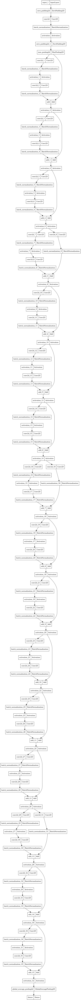

In [ ]:
tf.keras.utils.plot_model(resnet34_model)

## Problem2: Skip Connection Densenet121

In [ ]:
class BuildDensenet121():
    def __init__(self):
        pass
    
    
    def conv_block(self, inputs, k=32, is_skip_connection=True):
        x = layers.BatchNormalization()(inputs)
        x = layers.Activation('relu')(x)
        x = layers.Conv2D(filters=4*k, kernel_size=(1,1), use_bias=False)(x)
        
        x = layers.BatchNormalization()(x)
        x = layers.Activation('relu')(x)
        x = layers.Conv2D(filters=k, kernel_size=(3,3), padding='same', use_bias=False)(x)
        
        if is_skip_connection:
            skip_connection = layers.Concatenate(axis=-1)([inputs,x])
        else:
            skip_connection = x
        
        return skip_connection
    
    
    def dense_block(self, x, nums_block, k=32, is_skip_connection=True):
        for i in range(nums_block):
            x = self.conv_block(x, 32, is_skip_connection=is_skip_connection)
        return x
        
    
    
    def trasition_layer(self, inputs, fraction=0.5):
        channels = inputs.shape[-1]
        x = layers.BatchNormalization()(inputs)
        x = layers.Activation('relu')(x)
        x = layers.Conv2D(filters=fraction*channels, kernel_size=(1,1), use_bias=False)(x)
        x = layers.AveragePooling2D(2, strides=2)(x)
        
        return x
    
    def build_model(self, is_skip_connection, classes, input_shape=(224,224,3)):
        inputs = layers.Input(shape=input_shape)
#         x = layers.Conv2D(filters=64, kernel_size=(7,7), strides=2, padding='same', use_bias=False)(inputs)
#         x = layers.BatchNormalization()(x)
#         x = layers.Activation('relu')(x)
#         x = layers.ZeroPadding2D(padding=(1, 1))(x)
#         x = layers.MaxPooling2D(pool_size=3, strides=2)(x)
        
        x = layers.ZeroPadding2D(padding=((3, 3)))(inputs)
        x = layers.Conv2D(64, 7, strides=2, use_bias=False)(x)
        x = layers.BatchNormalization()(x)
        x = layers.Activation('relu')(x)
        x = layers.ZeroPadding2D(padding=((1, 1)))(x)
        x = layers.MaxPooling2D(3, strides=2)(x)
        
        # 1-6
        x = self.dense_block(x, nums_block=6, is_skip_connection=is_skip_connection)
        x = self.trasition_layer(x)
        
        # 2-12
        x = self.dense_block(x, nums_block=12, is_skip_connection=is_skip_connection)
        x = self.trasition_layer(x)
        
        # 3-24
        x = self.dense_block(x, nums_block=24, is_skip_connection=is_skip_connection)
        x = self.trasition_layer(x)
        
        #4-16
        x = self.dense_block(x, nums_block=16, is_skip_connection=is_skip_connection)
        
        x = layers.BatchNormalization()(x)
        x = layers.Activation('relu')(x)
        x = layers.GlobalAveragePooling2D()(x)
        x = layers.Dense(classes, activation='softmax')(x)
        
        model = Model(inputs=inputs, outputs=x)
        
        return model

In [ ]:
build_densenet121 = BuildDensenet121()
densenet121_model = build_densenet121.build_model(is_skip_connection=True, classes=1000)

In [ ]:
densenet121_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d_2 (ZeroPadding2  (None, 230, 230, 3)  0          ['input_2[0][0]']                
 D)                                                                                               
                                                                                                  
 conv2d_36 (Conv2D)             (None, 112, 112, 64  9408        ['zero_padding2d_2[0][0]']       
                                )                                                           

In [ ]:
a = tf.keras.applications.densenet.DenseNet121()
a.summary()

Model: "densenet121"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d_4 (ZeroPadding2  (None, 230, 230, 3)  0          ['input_3[0][0]']                
 D)                                                                                               
                                                                                                  
 conv1/conv (Conv2D)            (None, 112, 112, 64  9408        ['zero_padding2d_4[0][0]']       
                                )                                                       

In [ ]:
tf.keras.utils.plot_model(densenet121_model)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.785422 to fit



## Problem 3: Skip Connection Unet Architecture

In [ ]:
class BuildUnet():
    def __init__(self):
        pass
    
    def extract_first_features(self, filters, size):
        initializer = tf.random_normal_initializer(0., 0.02)

        result = tf.keras.Sequential()
        result.add(tf.keras.layers.Conv2D(filters, size, strides=1, padding='same',
                                          kernel_initializer=initializer, use_bias=False))
        result.add(tf.keras.layers.LeakyReLU())

        return result

    def downsample(self, filters, size):
        initializer = tf.random_normal_initializer(0., 0.02)

        result = tf.keras.Sequential()
        result.add(tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                                          kernel_initializer=initializer, use_bias=False))
        result.add(tf.keras.layers.LeakyReLU())

        return result

    def upsample(self, filters):
        initializer = tf.random_normal_initializer(0., 0.02)

        result = tf.keras.Sequential()
        result.add(tf.keras.layers.UpSampling2D(interpolation='bilinear'))
        result.add(tf.keras.layers.Conv2D(filters, 3, padding='same',
                                          kernel_initializer=initializer, use_bias=False))
        result.add(tf.keras.layers.ReLU())

        return result
    
    def UNet_process(self, x, is_skip_connection=True):
        down_stack = [
            self.downsample(64, 4,),  # (bs, 128, 128, 64)
            self.downsample(256, 4), # (bs, 64, 64, 256)
            self.downsample(512, 4), # (bs, 32, 32, 512)
            self.downsample(512, 4), # (bs, 16, 16, 512)
            self.downsample(512, 4), # (bs, 8, 8, 512)
        ]

        up_stack = [
            self.upsample(512), # (bs, 16, 16, 512)
            self.upsample(512), # (bs, 32, 32, 512)
            self.upsample(256), # (bs, 64, 64, 256)
            self.upsample(64),  # (bs, 128, 128, 64)
        ]

        initializer = tf.random_normal_initializer(0., 0.02)
        OUTPUT_CHANNELS = 3

        sample_l = tf.keras.layers.UpSampling2D(interpolation='bilinear')
        last = tf.keras.layers.Conv2D(OUTPUT_CHANNELS, 3, padding='same', activation='tanh',
                                      kernel_initializer=initializer, use_bias=False)

        concat = tf.keras.layers.Concatenate()

        # Downsampling through the model
        skips = []
        for down in down_stack:
            x = down(x)
            skips.append(x)

        skips = reversed(skips[:-1])

        # Upsampling and establishing the skip connections
        for up, skip in zip(up_stack, skips):
            x = up(x)
            if is_skip_connection:
                x = concat([x, skip])

        x = sample_l(x)
        x = last(x)

        return x
    
    def build_model(self, is_skip_connection=True, input_shape=(256, 256, 3)): 
        # multiple inputs
        inputs = tf.keras.layers.Input(shape=input_shape)

        x = inputs

        # ablation study 1
        fextract1 = self.extract_first_features(64, 3)
        x = fextract1(x) # (1,256,256,64)

        outputs = self.UNet_process(x, is_skip_connection=is_skip_connection)    

        return tf.keras.Model(inputs=[inputs], outputs=[outputs])

In [ ]:
build_unet = BuildUnet()
unet_model = build_unet.build_model(is_skip_connection=True)

In [ ]:
unet_model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 sequential (Sequential)        (None, 256, 256, 64  1728        ['input_4[0][0]']                
                                )                                                                 
                                                                                                  
 sequential_1 (Sequential)      (None, 128, 128, 64  65536       ['sequential[0][0]']             
                                )                                                           

## Problem4: Weather Recognition

In [ ]:
# list đường dẫn các file ảnh
WEATHER_DATA_PATH = '/media/aivn24/partition1/Khoa/CNN2/weather-dataset/dataset'
path_imgs = list(glob.glob(WEATHER_DATA_PATH+'/**/*.jpg'))


In [ ]:
# split đường dẫn các file để lấy label cho ảnh và tao thành dataframe để  thống kê
labels = list(map(lambda x:os.path.split(os.path.split(x)[0])[1], path_imgs))
file_path = pd.Series(path_imgs, name='File_Path').astype(str)
labels = pd.Series(labels, name='Labels')
data = pd.concat([file_path, labels], axis=1)
data = data.sample(frac=1).reset_index(drop=True)
data.head()

,File_Path,Labels
0,/media/aivn24/partition1/Khoa/CNN2/weather-dat...,fogsmog
1,/media/aivn24/partition1/Khoa/CNN2/weather-dat...,frost
2,/media/aivn24/partition1/Khoa/CNN2/weather-dat...,lightning
3,/media/aivn24/partition1/Khoa/CNN2/weather-dat...,rain
4,/media/aivn24/partition1/Khoa/CNN2/weather-dat...,sandstorm


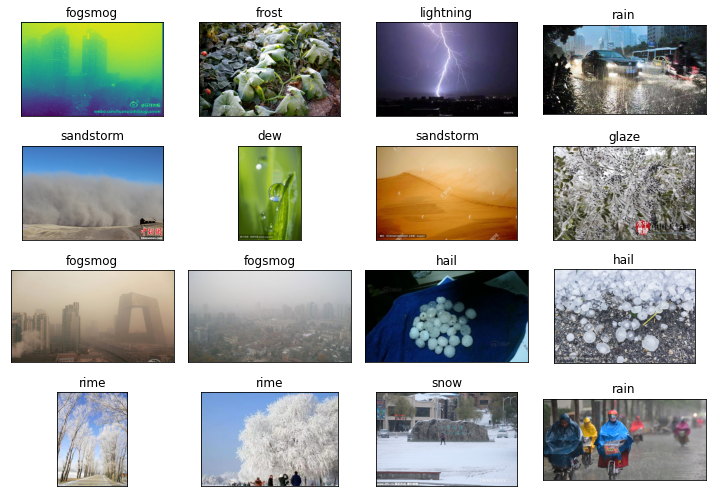

In [ ]:
# vẽ các ảnh tương ứng với label
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(10, 7),
                        subplot_kw={'xticks': [], 'yticks': []})
for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(data.File_Path[i]))
    ax.set_title(data.Labels[i])
plt.tight_layout()
plt.show()

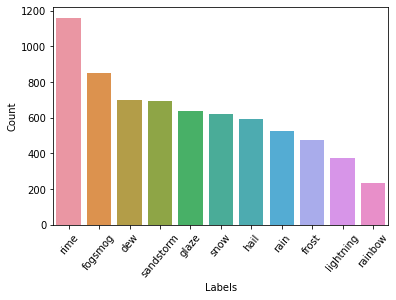

In [ ]:
# Thống kê số lượng ảnh cho từng label 
counts = data.Labels.value_counts()
sns.barplot(x=counts.index, y=counts)
plt.xlabel('Labels')
plt.ylabel('Count')
plt.xticks(rotation=50);

In [ ]:
batch_size = 32
img_height = 224
img_width = 224

In [ ]:
resnet34_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 230, 230, 3)  0          ['input_1[0][0]']                
                                                                                                  
 conv2d (Conv2D)                (None, 112, 112, 64  9408        ['zero_padding2d[0][0]']         
                                )                                                                 
                                                                                              

In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(
  directory=WEATHER_DATA_PATH,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 6862 files belonging to 11 classes.
Using 5490 files for training.


In [ ]:
val_ds = tf.keras.utils.image_dataset_from_directory(
  directory=WEATHER_DATA_PATH,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 6862 files belonging to 11 classes.
Using 1372 files for validation.


In [ ]:
class_names = train_ds.class_names
print(class_names)

['dew', 'fogsmog', 'frost', 'glaze', 'hail', 'lightning', 'rain', 'rainbow', 'rime', 'sandstorm', 'snow']


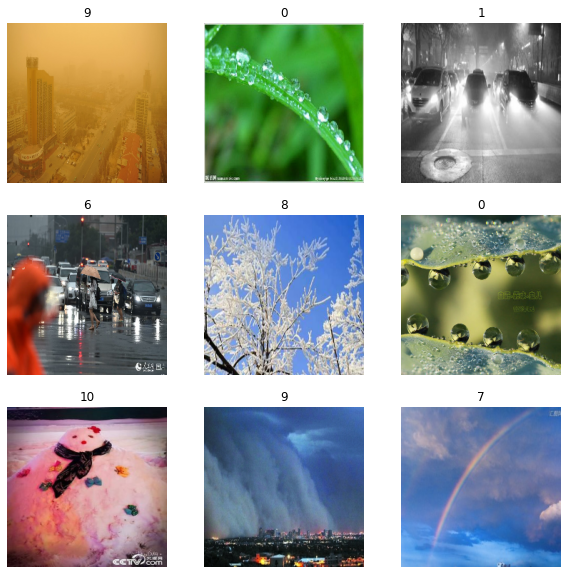

In [ ]:
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(int(labels[i]))
        plt.axis("off")

#### Data Augmentation

In [ ]:
data_augmentation = tf.keras.Sequential([
  layers.Rescaling(scale=1./255),
  layers.RandomFlip("horizontal"),
  layers.RandomRotation(0.1),
  layers.RandomTranslation(height_factor=(-0.1, 0.1), width_factor=(-0.1, 0.1), fill_mode='nearest')
])

In [ ]:
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(32, 224, 224, 3)
(32,)


In [ ]:
labels_batch

<tf.Tensor: shape=(32,), dtype=int32, numpy=
array([ 7,  3,  9, 10, 10,  4,  1,  6,  0,  0,  8,  0,  8, 10,  3,  1,  8,
        2,  1,  0,  2,  2,  7,  6,  0,  9,  9,  5,  9, 10,  6,  0],
      dtype=int32)>

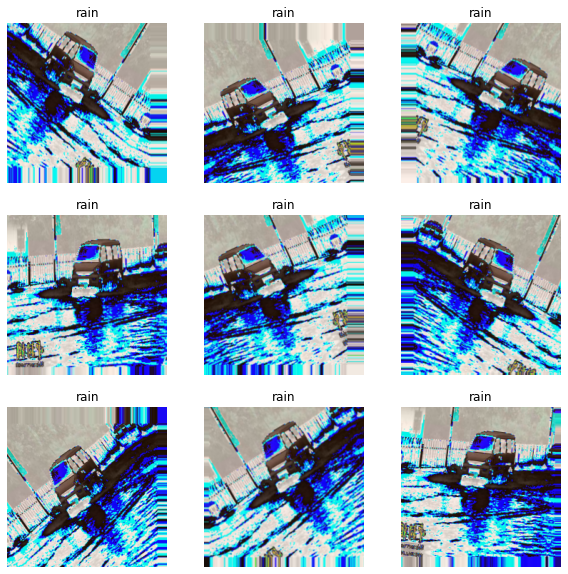

In [ ]:

plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(data_augmentation(np.expand_dims(images[0].numpy(),axis=0).astype("uint8"))[0])
    plt.title(class_names[labels[0]])
    plt.axis("off")

### ResNet34 No Skip Connection

In [ ]:
build_resnet34 = BuildResNet34()
resnet34_model_noskip = build_resnet34.build_model(is_skip_connection=False, classes=11)

image_input = layers.Input(shape=(img_height,img_width,3))
x = data_augmentation(image_input)
x = resnet34_model_noskip(x)
weather_resnet34_model_noskip = Model(inputs=image_input, outputs=x)

weather_resnet34_model_noskip.summary()

Model: "model_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_14 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 sequential_41 (Sequential)  (None, 224, 224, 3)       0         
                                                                 
 model_10 (Functional)       (None, 11)                21131723  
                                                                 
Total params: 21,131,723
Trainable params: 21,116,491
Non-trainable params: 15,232
_________________________________________________________________


In [ ]:
weather_resnet34_model_noskip.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
                      loss=tf.keras.losses.SparseCategoricalCrossentropy(), 
                      metrics=['accuracy'])


In [ ]:
num_epochs = 50

checkpoint_path = "/media/aivn24/partition1/Khoa/CNN2/save_model/weather_resnet34_model_noskip.h5"
os.makedirs("/media/aivn24/partition1/Khoa/CNN2/save_model", exist_ok=True)
# os.makedirs
model_checkpoint = tf.keras.callbacks.ModelCheckpoint(
            filepath=checkpoint_path,
            verbose=1,
            save_weights_only=True,
            monitor='val_accuracy',
            mode='max',
            save_best_only=True)
learning_rate_reduction = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_accuracy', 
                                            patience = 5, 
                                            verbose=1,
                                            factor=0.5, 
                                            min_lr=0.00001)



history = weather_resnet34_model_noskip.fit(train_ds,
                                epochs = num_epochs,
                                validation_data = val_ds,
                                callbacks=[model_checkpoint])

Epoch 1/50
171/172 [============================>.] - ETA: 0s - loss: 1.8115 - accuracy: 0.3761
Epoch 00001: val_accuracy improved from -inf to 0.11152, saving model to /media/aivn24/partition1/Khoa/CNN2/save_model/weather_resnet34_model_noskip.h5
172/172 [==============================] - 11s 59ms/step - loss: 1.8112 - accuracy: 0.3767 - val_loss: 7.8426 - val_accuracy: 0.1115
Epoch 2/50
172/172 [==============================] - ETA: 0s - loss: 1.4241 - accuracy: 0.5128
Epoch 00002: val_accuracy improved from 0.11152 to 0.34475, saving model to /media/aivn24/partition1/Khoa/CNN2/save_model/weather_resnet34_model_noskip.h5
172/172 [==============================] - 10s 59ms/step - loss: 1.4241 - accuracy: 0.5128 - val_loss: 2.8790 - val_accuracy: 0.3448
Epoch 3/50
172/172 [==============================] - ETA: 0s - loss: 1.2970 - accuracy: 0.5512
Epoch 00003: val_accuracy improved from 0.34475 to 0.46283, saving model to /media/aivn24/partition1/Khoa/CNN2/save_model/weather_resnet34_

Epoch 26/50
171/172 [============================>.] - ETA: 0s - loss: 0.8151 - accuracy: 0.7206
Epoch 00026: val_accuracy improved from 0.68440 to 0.69388, saving model to /media/aivn24/partition1/Khoa/CNN2/save_model/weather_resnet34_model_noskip.h5
172/172 [==============================] - 10s 60ms/step - loss: 0.8152 - accuracy: 0.7206 - val_loss: 0.9550 - val_accuracy: 0.6939
Epoch 27/50
172/172 [==============================] - ETA: 0s - loss: 0.8040 - accuracy: 0.7211
Epoch 00027: val_accuracy did not improve from 0.69388
172/172 [==============================] - 10s 56ms/step - loss: 0.8040 - accuracy: 0.7211 - val_loss: 1.0251 - val_accuracy: 0.6633
Epoch 28/50
172/172 [==============================] - ETA: 0s - loss: 0.7922 - accuracy: 0.7264
Epoch 00028: val_accuracy did not improve from 0.69388
172/172 [==============================] - 10s 57ms/step - loss: 0.7922 - accuracy: 0.7264 - val_loss: 0.9560 - val_accuracy: 0.6735
Epoch 29/50
172/172 [========================

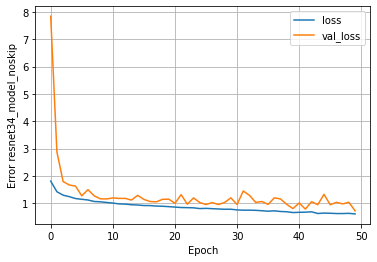

In [ ]:
plt.plot(history.history['loss'], label='loss')
plt.plot(history.history['val_loss'], label='val_loss')
plt.xlabel('Epoch')
plt.ylabel('Error resnet34_model_noskip')
plt.legend()
plt.grid(True)

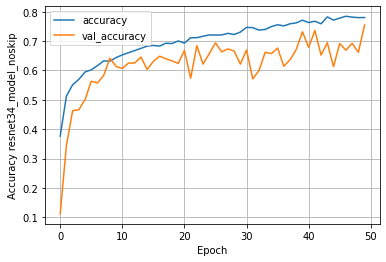

In [ ]:
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy resnet34_model_noskip')
plt.legend()
plt.grid(True)

In [ ]:
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.tail()

,loss,accuracy,val_loss,val_accuracy,epoch
45,0.636384,0.778324,0.947900,0.691691,45
46,0.625219,0.784699,1.036238,0.669096,46
47,0.625732,0.781603,0.978857,0.692420,47
48,0.632754,0.779964,1.038708,0.661808,48
49,0.611954,0.780328,0.726410,0.754373,49


### ResNet34

In [ ]:
build_resnet34 = BuildResNet34()
resnet34_model = build_resnet34.build_model(is_skip_connection=True, classes=11)

image_input = layers.Input(shape=(img_height,img_width,3))
x = data_augmentation(image_input)
x = resnet34_model(x)
weather_resnet34_model = Model(inputs=image_input, outputs=x)

weather_resnet34_model.summary()

Model: "model_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_16 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 sequential_41 (Sequential)  (None, 224, 224, 3)       0         
                                                                 
 model_12 (Functional)       (None, 11)                21307339  
                                                                 
Total params: 21,307,339
Trainable params: 21,290,315
Non-trainable params: 17,024
_________________________________________________________________


In [ ]:
weather_resnet34_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
                      loss=tf.keras.losses.SparseCategoricalCrossentropy(), 
                      metrics=['accuracy'])


In [ ]:
num_epochs = 50

checkpoint_path = "/media/aivn24/partition1/Khoa/CNN2/save_model/weather_resnet34_model.h5"
os.makedirs("/media/aivn24/partition1/Khoa/CNN2/save_model", exist_ok=True)
# os.makedirs
model_checkpoint = tf.keras.callbacks.ModelCheckpoint(
            filepath=checkpoint_path,
            verbose=1,
            save_weights_only=True,
            monitor='val_accuracy',
            mode='max',
            save_best_only=True)
learning_rate_reduction = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_accuracy', 
                                            patience = 5, 
                                            verbose=1,
                                            factor=0.5, 
                                            min_lr=0.00001)



history = weather_resnet34_model.fit(train_ds,
                                epochs = num_epochs,
                                validation_data = val_ds,
                                callbacks=[model_checkpoint])

Epoch 1/50
172/172 [==============================] - ETA: 0s - loss: 1.4697 - accuracy: 0.5281
Epoch 00001: val_accuracy improved from -inf to 0.47741, saving model to /media/aivn24/partition1/Khoa/CNN2/save_model/weather_resnet34_model.h5
172/172 [==============================] - 12s 61ms/step - loss: 1.4697 - accuracy: 0.5281 - val_loss: 1.7420 - val_accuracy: 0.4774
Epoch 2/50
171/172 [============================>.] - ETA: 0s - loss: 1.1390 - accuracy: 0.6106
Epoch 00002: val_accuracy improved from 0.47741 to 0.60131, saving model to /media/aivn24/partition1/Khoa/CNN2/save_model/weather_resnet34_model.h5
172/172 [==============================] - 11s 62ms/step - loss: 1.1390 - accuracy: 0.6106 - val_loss: 1.2022 - val_accuracy: 0.6013
Epoch 3/50
171/172 [============================>.] - ETA: 0s - loss: 1.0294 - accuracy: 0.6504
Epoch 00003: val_accuracy did not improve from 0.60131
172/172 [==============================] - 10s 59ms/step - loss: 1.0292 - accuracy: 0.6505 - val_l

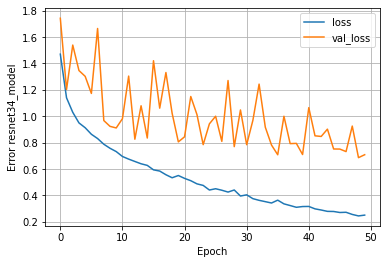

In [ ]:
plt.plot(history.history['loss'], label='loss')
plt.plot(history.history['val_loss'], label='val_loss')
plt.xlabel('Epoch')
plt.ylabel('Error resnet34_model')
plt.legend()
plt.grid(True)

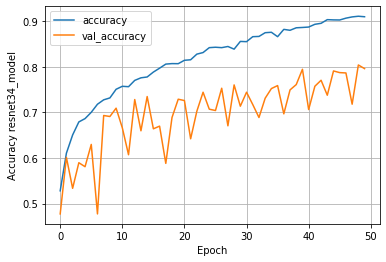

In [ ]:
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy resnet34_model')
plt.legend()
plt.grid(True)

In [ ]:
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.tail()

,loss,accuracy,val_loss,val_accuracy,epoch
45,0.270003,0.902550,0.750631,0.787172,45
46,0.271690,0.906557,0.731569,0.786443,46
47,0.255316,0.909290,0.924869,0.717930,47
48,0.244112,0.910747,0.685618,0.803936,48
49,0.250178,0.909654,0.707869,0.795918,49


### Densenet121 No Skip Connection

In [ ]:
build_densenet121 = BuildDensenet121()
densenet121_model_noskip = build_densenet121.build_model(is_skip_connection=False, classes=11)

image_input = layers.Input(shape=(img_height,img_width,3))
x = data_augmentation(image_input)
x = densenet121_model_noskip(x)
weather_densenet121_model_noskip = Model(inputs=image_input, outputs=x)

weather_densenet121_model_noskip.summary()

Model: "model_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_18 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 sequential_41 (Sequential)  (None, 224, 224, 3)       0         
                                                                 
 model_14 (Functional)       (None, 11)                2422763   
                                                                 
Total params: 2,422,763
Trainable params: 2,403,851
Non-trainable params: 18,912
_________________________________________________________________


In [ ]:
weather_densenet121_model_noskip.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
                      loss=tf.keras.losses.SparseCategoricalCrossentropy(), 
                      metrics=['accuracy'])


In [ ]:
num_epochs = 50

checkpoint_path = "/media/aivn24/partition1/Khoa/CNN2/save_model/weather_densenet121_model_noskip.h5"
os.makedirs("/media/aivn24/partition1/Khoa/CNN2/save_model", exist_ok=True)
# os.makedirs
model_checkpoint = tf.keras.callbacks.ModelCheckpoint(
            filepath=checkpoint_path,
            verbose=1,
            save_weights_only=True,
            monitor='val_accuracy',
            mode='max',
            save_best_only=True)
learning_rate_reduction = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_accuracy', 
                                            patience = 5, 
                                            verbose=1,
                                            factor=0.5, 
                                            min_lr=0.00001)



history = weather_densenet121_model_noskip.fit(train_ds,
                                epochs = num_epochs,
                                validation_data = val_ds,
                                callbacks=[model_checkpoint])

Epoch 1/50
172/172 [==============================] - ETA: 0s - loss: 2.3757 - accuracy: 0.1404
Epoch 00001: val_accuracy improved from -inf to 0.11152, saving model to /media/aivn24/partition1/Khoa/CNN2/save_model/weather_densenet121_model_noskip.h5
172/172 [==============================] - 15s 70ms/step - loss: 2.3757 - accuracy: 0.1404 - val_loss: 2.3915 - val_accuracy: 0.1115
Epoch 2/50
171/172 [============================>.] - ETA: 0s - loss: 2.3505 - accuracy: 0.1504
Epoch 00002: val_accuracy did not improve from 0.11152
172/172 [==============================] - 11s 65ms/step - loss: 2.3503 - accuracy: 0.1505 - val_loss: 2.3710 - val_accuracy: 0.1115
Epoch 3/50
171/172 [============================>.] - ETA: 0s - loss: 2.3197 - accuracy: 0.1798
Epoch 00003: val_accuracy improved from 0.11152 to 0.17566, saving model to /media/aivn24/partition1/Khoa/CNN2/save_model/weather_densenet121_model_noskip.h5
172/172 [==============================] - 12s 66ms/step - loss: 2.3193 - accu

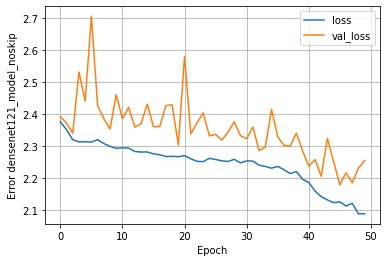

In [ ]:
plt.plot(history.history['loss'], label='loss')
plt.plot(history.history['val_loss'], label='val_loss')
plt.xlabel('Epoch')
plt.ylabel('Error densenet121_model_noskip')
plt.legend()
plt.grid(True)

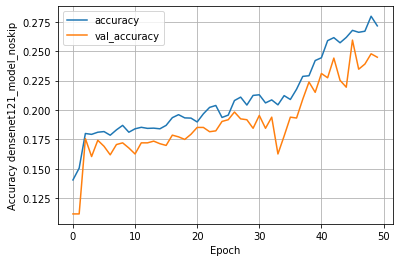

In [ ]:
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy densenet121_model_noskip')
plt.legend()
plt.grid(True)

In [ ]:
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.tail()

,loss,accuracy,val_loss,val_accuracy,epoch
45,2.124493,0.267760,2.178264,0.259475,45
46,2.111595,0.266120,2.215273,0.234694,46
47,2.120027,0.267031,2.184422,0.239067,47
48,2.086873,0.279781,2.230217,0.247813,48
49,2.087531,0.271585,2.254217,0.244898,49


### Densenet121

In [ ]:
build_densenet121 = BuildDensenet121()
densenet121_model = build_densenet121.build_model(is_skip_connection=True, classes=11)

image_input = layers.Input(shape=(img_height,img_width,3))
x = data_augmentation(image_input)
x = densenet121_model(x)
weather_densenet121_model = Model(inputs=image_input, outputs=x)

weather_densenet121_model.summary()

Model: "model_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_20 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 sequential_41 (Sequential)  (None, 224, 224, 3)       0         
                                                                 
 model_16 (Functional)       (None, 11)                7048779   
                                                                 
Total params: 7,048,779
Trainable params: 6,965,131
Non-trainable params: 83,648
_________________________________________________________________


In [ ]:
weather_densenet121_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
                      loss=tf.keras.losses.SparseCategoricalCrossentropy(), 
                      metrics=['accuracy'])


In [ ]:
num_epochs = 50

checkpoint_path = "/media/aivn24/partition1/Khoa/CNN2/save_model/weather_densenet121_model.h5"
os.makedirs("/media/aivn24/partition1/Khoa/CNN2/save_model", exist_ok=True)
# os.makedirs
model_checkpoint = tf.keras.callbacks.ModelCheckpoint(
            filepath=checkpoint_path,
            verbose=1,
            save_weights_only=True,
            monitor='val_accuracy',
            mode='max',
            save_best_only=True)
learning_rate_reduction = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_accuracy', 
                                            patience = 5, 
                                            verbose=1,
                                            factor=0.5, 
                                            min_lr=0.00001)



history = weather_densenet121_model.fit(train_ds,
                                epochs = num_epochs,
                                validation_data = val_ds,
                                callbacks=[model_checkpoint])

Epoch 1/50
172/172 [==============================] - ETA: 0s - loss: 1.3131 - accuracy: 0.5628
Epoch 00001: val_accuracy improved from -inf to 0.43732, saving model to /media/aivn24/partition1/Khoa/CNN2/save_model/weather_densenet121_model.h5
172/172 [==============================] - 27s 130ms/step - loss: 1.3131 - accuracy: 0.5628 - val_loss: 1.6904 - val_accuracy: 0.4373
Epoch 2/50
172/172 [==============================] - ETA: 0s - loss: 1.0779 - accuracy: 0.6311
Epoch 00002: val_accuracy improved from 0.43732 to 0.62172, saving model to /media/aivn24/partition1/Khoa/CNN2/save_model/weather_densenet121_model.h5
172/172 [==============================] - 21s 120ms/step - loss: 1.0779 - accuracy: 0.6311 - val_loss: 1.0926 - val_accuracy: 0.6217
Epoch 3/50
172/172 [==============================] - ETA: 0s - loss: 0.9747 - accuracy: 0.6727
Epoch 00003: val_accuracy did not improve from 0.62172
172/172 [==============================] - 20s 118ms/step - loss: 0.9747 - accuracy: 0.672

172/172 [==============================] - ETA: 0s - loss: 0.3647 - accuracy: 0.8721
Epoch 00027: val_accuracy did not improve from 0.76749
172/172 [==============================] - 20s 118ms/step - loss: 0.3647 - accuracy: 0.8721 - val_loss: 1.0713 - val_accuracy: 0.6953
Epoch 28/50
172/172 [==============================] - ETA: 0s - loss: 0.3517 - accuracy: 0.8732
Epoch 00028: val_accuracy did not improve from 0.76749
172/172 [==============================] - 20s 118ms/step - loss: 0.3517 - accuracy: 0.8732 - val_loss: 0.9455 - val_accuracy: 0.7391
Epoch 29/50
172/172 [==============================] - ETA: 0s - loss: 0.3458 - accuracy: 0.8783
Epoch 00029: val_accuracy did not improve from 0.76749
172/172 [==============================] - 20s 118ms/step - loss: 0.3458 - accuracy: 0.8783 - val_loss: 0.9194 - val_accuracy: 0.7325
Epoch 30/50
172/172 [==============================] - ETA: 0s - loss: 0.3442 - accuracy: 0.8776
Epoch 00030: val_accuracy improved from 0.76749 to 0.7930

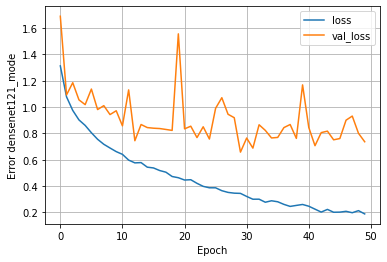

In [ ]:
plt.plot(history.history['loss'], label='loss')
plt.plot(history.history['val_loss'], label='val_loss')
plt.xlabel('Epoch')
plt.ylabel('Error densenet121_mode')
plt.legend()
plt.grid(True)

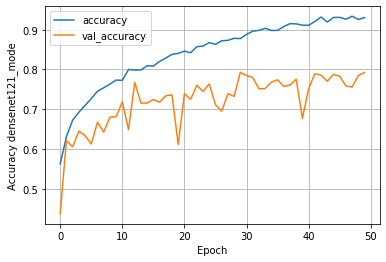

In [ ]:
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy densenet121_mode')
plt.legend()
plt.grid(True)

In [ ]:
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.tail()

,loss,accuracy,val_loss,val_accuracy,epoch
45,0.201741,0.930965,0.760999,0.782799,45
46,0.207831,0.926230,0.900547,0.758746,46
47,0.197178,0.933698,0.931671,0.755831,47
48,0.213027,0.925683,0.800833,0.784985,48
49,0.188120,0.930237,0.736618,0.792274,49


## Problem5: Super Resolution with UNET

### Prepare Super Resolution Dataset

#### Split Tran Validation data

In [ ]:
LHR_TRAIN_DATA_PATH = '/media/aivn24/partition1/Khoa/CNN2/K_LHR_image/K_LHR_image/train'
LHR_VAL_DATA_PATH = '/media/aivn24/partition1/Khoa/CNN2/K_LHR_image/K_LHR_image/val'


BATCH_SIZE  = 32
BUFFER_SIZE = BATCH_SIZE*10
IMG_WIDTH   = 64
IMG_HEIGHT  = 64

def load(image_file):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image,channels=3)
        
    input_image  = tf.image.resize(image, (IMG_HEIGHT, IMG_WIDTH))
    target_image = image
    
    input_image  = tf.cast(input_image, tf.float32)
    target_image = tf.cast(target_image, tf.float32)

    # clip
    # input_image = tf.clip_by_value(input_image, 0.0, 255.0)


    return input_image, target_image

(64, 64, 3)
(256, 256, 3)


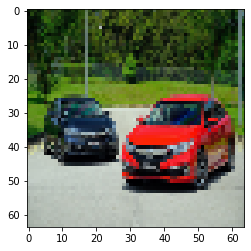

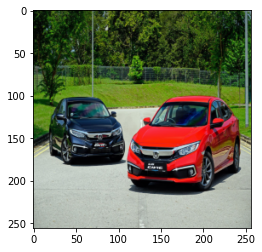

In [ ]:
input_image, target_image = load(LHR_TRAIN_DATA_PATH+'/0.png')
print(input_image.shape)
print(target_image.shape)


# casting to int for matplotlib to show the image
plt.figure()
plt.imshow(input_image/255.0)
plt.figure()
plt.imshow(target_image/255.0)

In [ ]:
# normalizing the images to [-1, 1]
def normalize(input_image, target_image):
    input_image  = (input_image / 127.5) - 1
    target_image = (target_image / 127.5) - 1

    return input_image, target_image

#@tf.function()
def random_jitter(input_image, target_image):
    if tf.random.uniform(()) > 0.5:
        input_image  = tf.image.flip_left_right(input_image)
        target_image = tf.image.flip_left_right(target_image)

    return input_image, target_image

def load_image_train(image_file):
    input_image, target_image = load(image_file)
    # input_image, target_image = random_jitter(input_image, target_image)
    input_image, target_image = normalize(input_image, target_image)

    return input_image, target_image

def load_image_test(image_file):
    input_image, target_image = load(image_file)
    input_image, target_image = normalize(input_image, target_image)

    return input_image, target_image

In [ ]:
# train_dataset
train_dataset = tf.data.Dataset.list_files(LHR_TRAIN_DATA_PATH + '/*.png')
train_dataset = train_dataset.map(load_image_train, num_parallel_calls=tf.data.experimental.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(1)

# test_dataset
test_dataset = tf.data.Dataset.list_files(LHR_VAL_DATA_PATH + '/*.png')
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(1)

In [ ]:
def generator_loss(fake, target):
    l1_loss = tf.reduce_mean(tf.abs(fake-target))
    
    return l1_loss

In [ ]:
def evaluate(model, epoch):  
    psnr_mean = 0.0
    count = 0
    for inputs, targets in test_dataset:
        fake = model([inputs], training=True)
         
        psnr = tf.image.psnr(fake*0.5 + 0.5, targets*0.5 + 0.5, max_val=1.0)

        __psnr_mean = tf.math.reduce_mean(psnr)
        # psnr_mean = psnr_mean_l
        
        psnr_mean += __psnr_mean
        count =count + 1
    
    psnr_mean = psnr_mean/count
    print('-------- psnr: ', psnr_mean.numpy(), '   ----- epoch: ', epoch, '  count: ', count)
    
    return psnr_mean
    
def generate_images(model, inputs, targets):
    fake = model([inputs], training=True)
    plt.figure(figsize=(15,20))
    
    display_list = [inputs[0], targets[0], fake[0]]
    title = ['Input', 'Real', 'Predicted']    

    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.axis('off')
    plt.show()        

### Train

#### Unet No Skip Connection1

In [ ]:
build_unet = BuildUnet()
unet_model_noskip = build_unet.build_model(is_skip_connection=False)

image_input = layers.Input(shape=(IMG_HEIGHT,IMG_WIDTH,3))
x = tf.keras.layers.Resizing(height=256, width=256)(image_input)
x = unet_model_noskip(x)
SR_unet_model_noskip = Model(inputs=image_input, outputs=x)

SR_unet_model_noskip.summary()

Model: "model_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_10 (InputLayer)       [(None, 64, 64, 3)]       0         
                                                                 
 resizing_1 (Resizing)       (None, 256, 256, 3)       0         
                                                                 
 model_6 (Functional)        (None, 256, 256, 3)       16862592  
                                                                 
Total params: 16,862,592
Trainable params: 16,862,592
Non-trainable params: 0
_________________________________________________________________


In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(1e-4, beta_1=0.5)

@tf.function
def train_step(inputs, targets):
    with tf.GradientTape() as tape:
        # output
        fake = SR_unet_model_noskip([inputs], training=True)     
        loss = generator_loss(fake, targets)
        

    generator_gradients = tape.gradient(loss, SR_unet_model_noskip.trainable_variables)
    generator_optimizer.apply_gradients(zip(generator_gradients, SR_unet_model_noskip.trainable_variables))
    
    return loss

    
    
def fit(train_ds, epochs, test_ds):
    best_pnsr = 0.0
    for epoch in range(epochs):
        # Train
        total_loss = 0.0
        for inputs, targets in train_ds:
            loss = train_step(inputs, targets)
            total_loss = total_loss + loss
        total_loss = total_loss/400
        print('epoch: {}   loss: {}'.format(epoch, total_loss))
        
        pnsr = evaluate(SR_unet_model_noskip, epoch)        
        if best_pnsr < pnsr:
            best_pnsr = pnsr
            
            for inputs, targets in test_ds.take(1):
                generate_images(SR_unet_model_noskip, inputs, targets)


epoch: 0   loss: 0.419297456741333
-------- psnr:  17.491241    ----- epoch:  0   count:  170


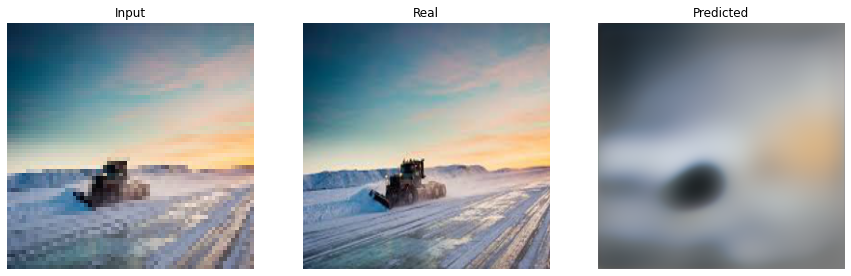

epoch: 1   loss: 0.3589405417442322
-------- psnr:  17.963749    ----- epoch:  1   count:  170


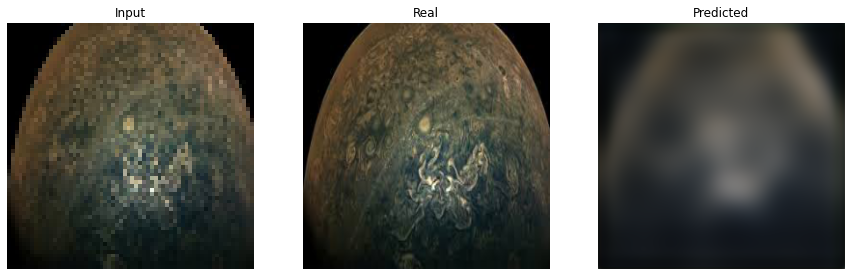

epoch: 2   loss: 0.3336723744869232
-------- psnr:  18.396362    ----- epoch:  2   count:  170


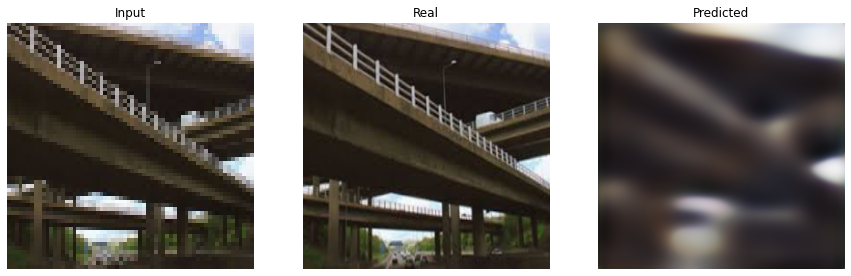

epoch: 3   loss: 0.30282044410705566
-------- psnr:  18.897785    ----- epoch:  3   count:  170


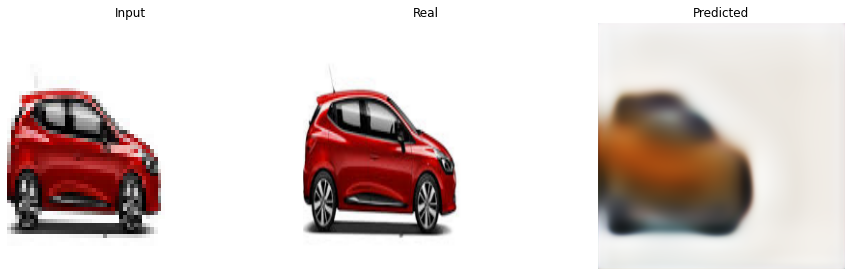

epoch: 4   loss: 0.2918631434440613
-------- psnr:  18.800007    ----- epoch:  4   count:  170
epoch: 5   loss: 0.28281158208847046
-------- psnr:  18.888767    ----- epoch:  5   count:  170
epoch: 6   loss: 0.276445209980011
-------- psnr:  18.87157    ----- epoch:  6   count:  170
epoch: 7   loss: 0.26878470182418823
-------- psnr:  19.355463    ----- epoch:  7   count:  170


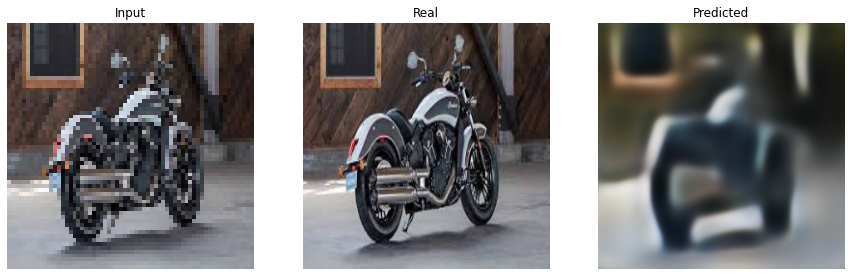

epoch: 8   loss: 0.26428234577178955
-------- psnr:  19.11681    ----- epoch:  8   count:  170
epoch: 9   loss: 0.2590627670288086
-------- psnr:  19.345524    ----- epoch:  9   count:  170
epoch: 10   loss: 0.2513090968132019
-------- psnr:  19.895222    ----- epoch:  10   count:  170


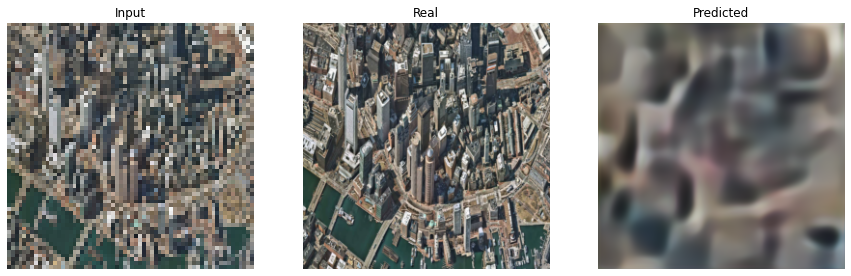

epoch: 11   loss: 0.24960264563560486
-------- psnr:  19.862444    ----- epoch:  11   count:  170
epoch: 12   loss: 0.24426153302192688
-------- psnr:  19.897518    ----- epoch:  12   count:  170


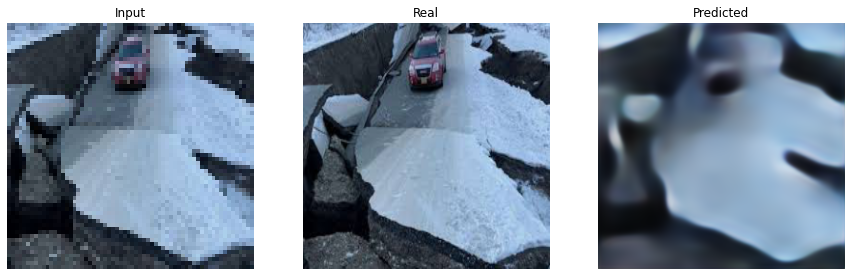

epoch: 13   loss: 0.24031318724155426
-------- psnr:  19.544264    ----- epoch:  13   count:  170
epoch: 14   loss: 0.23655687272548676
-------- psnr:  20.274029    ----- epoch:  14   count:  170


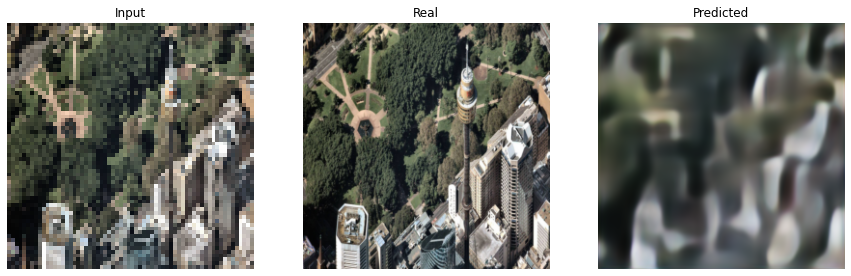

epoch: 15   loss: 0.233420729637146
-------- psnr:  18.354534    ----- epoch:  15   count:  170
epoch: 16   loss: 0.23198337852954865
-------- psnr:  20.398836    ----- epoch:  16   count:  170


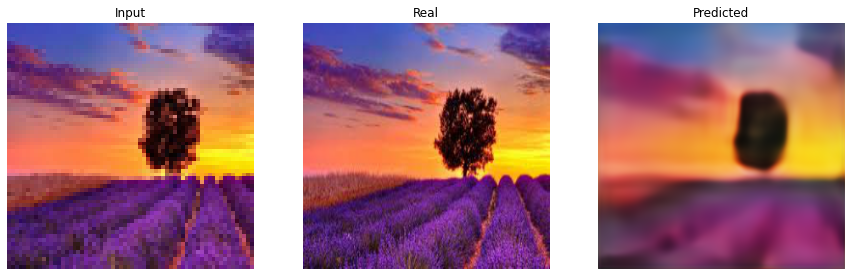

epoch: 17   loss: 0.2259625792503357
-------- psnr:  20.426802    ----- epoch:  17   count:  170


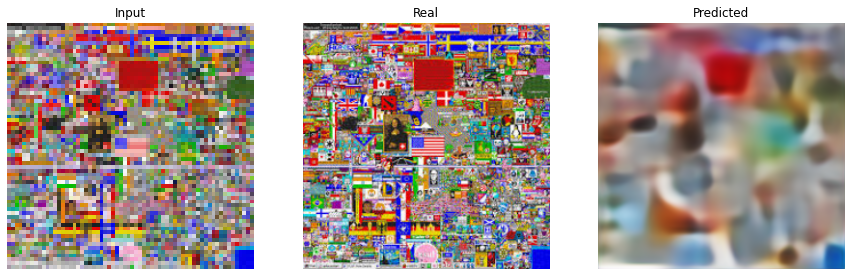

epoch: 18   loss: 0.22410964965820312
-------- psnr:  20.358664    ----- epoch:  18   count:  170
epoch: 19   loss: 0.22257739305496216
-------- psnr:  20.550064    ----- epoch:  19   count:  170


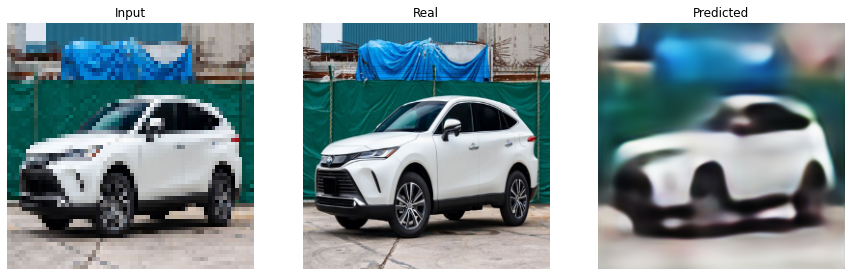

epoch: 20   loss: 0.22168129682540894
-------- psnr:  20.686157    ----- epoch:  20   count:  170


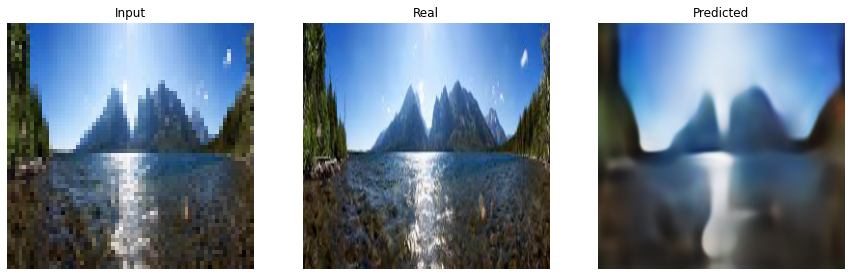

epoch: 21   loss: 0.2186257392168045
-------- psnr:  20.74693    ----- epoch:  21   count:  170


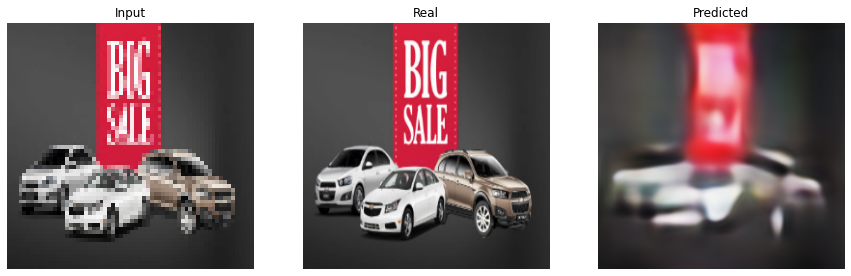

epoch: 22   loss: 0.21614395081996918
-------- psnr:  20.652456    ----- epoch:  22   count:  170
epoch: 23   loss: 0.2135530263185501
-------- psnr:  20.78802    ----- epoch:  23   count:  170


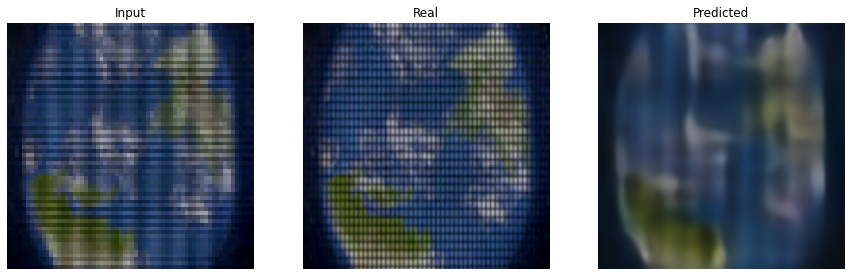

epoch: 24   loss: 0.21046990156173706
-------- psnr:  20.735796    ----- epoch:  24   count:  170
epoch: 25   loss: 0.20939677953720093
-------- psnr:  20.715439    ----- epoch:  25   count:  170
epoch: 26   loss: 0.2078298032283783
-------- psnr:  20.871092    ----- epoch:  26   count:  170


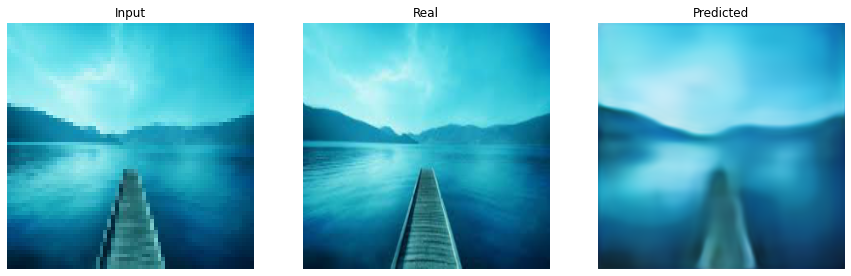

epoch: 27   loss: 0.20576192438602448
-------- psnr:  20.638725    ----- epoch:  27   count:  170
epoch: 28   loss: 0.2058170735836029
-------- psnr:  20.864365    ----- epoch:  28   count:  170
epoch: 29   loss: 0.20068320631980896
-------- psnr:  20.42677    ----- epoch:  29   count:  170
epoch: 30   loss: 0.20027591288089752
-------- psnr:  21.033144    ----- epoch:  30   count:  170


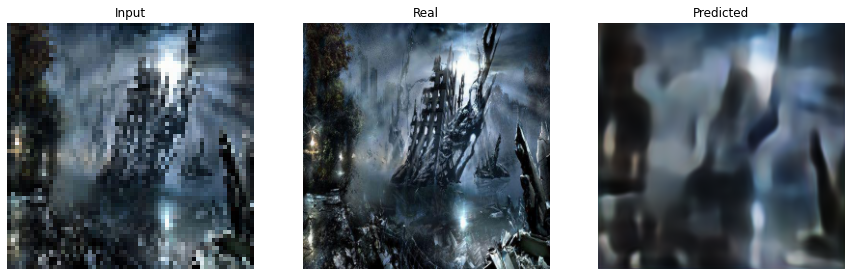

epoch: 31   loss: 0.19862592220306396
-------- psnr:  20.747677    ----- epoch:  31   count:  170
epoch: 32   loss: 0.19782304763793945
-------- psnr:  21.14648    ----- epoch:  32   count:  170


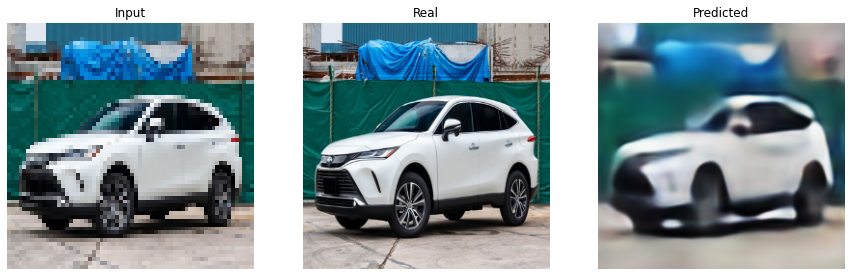

epoch: 33   loss: 0.19728069007396698
-------- psnr:  20.656763    ----- epoch:  33   count:  170
epoch: 34   loss: 0.1947374939918518
-------- psnr:  20.582836    ----- epoch:  34   count:  170
epoch: 35   loss: 0.19457130134105682
-------- psnr:  20.901258    ----- epoch:  35   count:  170
epoch: 36   loss: 0.19151082634925842
-------- psnr:  21.062317    ----- epoch:  36   count:  170
epoch: 37   loss: 0.1888924539089203
-------- psnr:  20.97737    ----- epoch:  37   count:  170
epoch: 38   loss: 0.19030120968818665
-------- psnr:  21.160282    ----- epoch:  38   count:  170


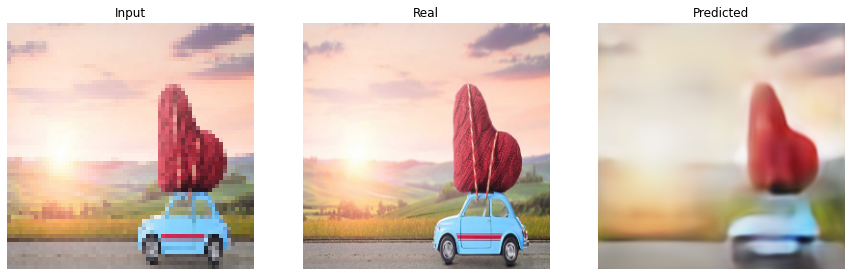

epoch: 39   loss: 0.18848632276058197
-------- psnr:  21.21444    ----- epoch:  39   count:  170


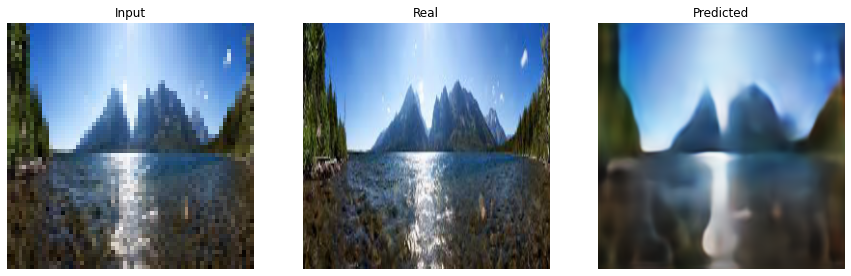

In [ ]:
EPOCHS = 40
fit(train_dataset, EPOCHS, test_dataset)

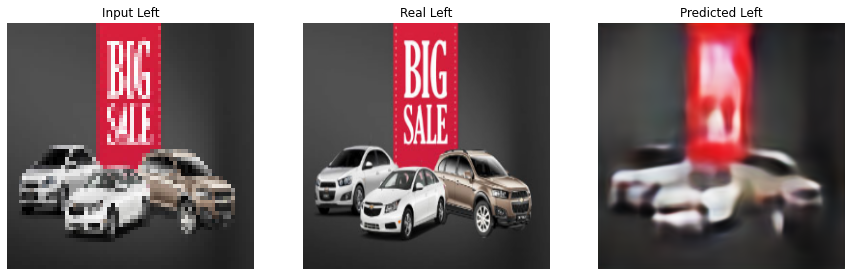

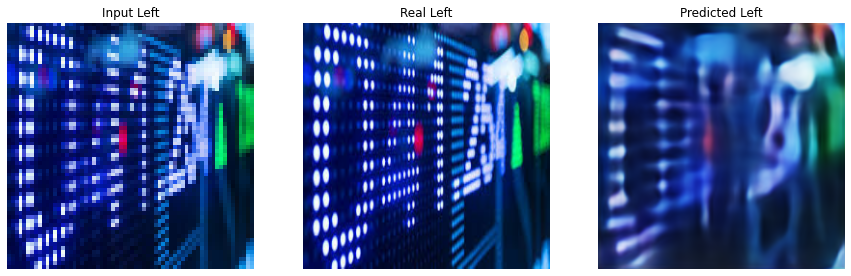

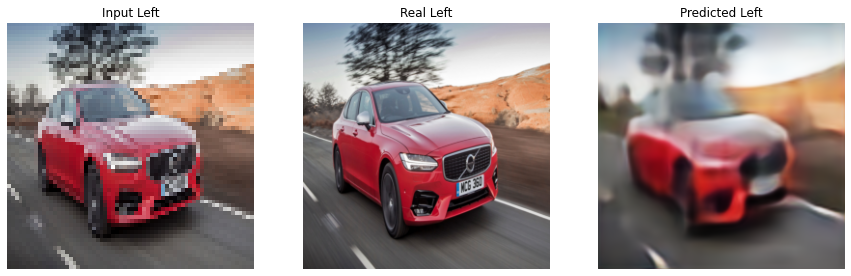

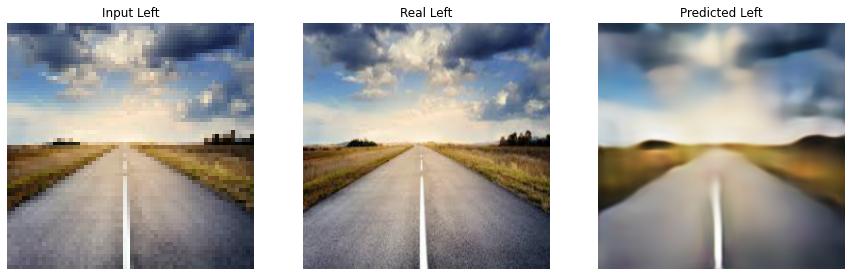

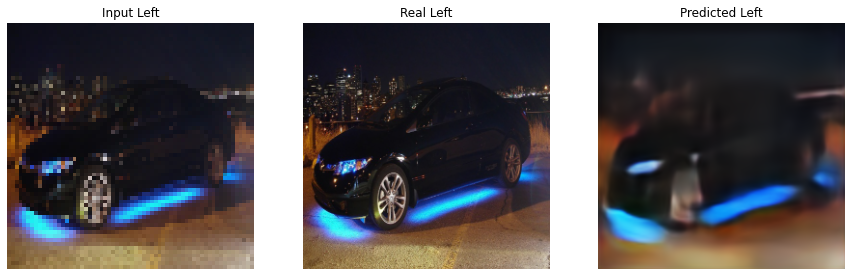

In [ ]:
for _ in range(5):
    for inputs, targets in test_dataset.take(1):
        fake = SR_unet_model_noskip([inputs], training=True)
        plt.figure(figsize=(15,20))

        display_list = [inputs[0], targets[0], fake[0]]
        title = ['Input Left', 'Real Left', 'Predicted Left']    

        for i in range(3):
            plt.subplot(1, 3, i+1)
            plt.title(title[i])
            plt.imshow(display_list[i] * 0.5 + 0.5)
            plt.axis('off')
        plt.show() 

#### Unet

In [ ]:
build_unet = BuildUnet()
unet_model = build_unet.build_model(is_skip_connection=True)

image_input = layers.Input(shape=(IMG_HEIGHT,IMG_WIDTH,3))
x = tf.keras.layers.Resizing(height=256, width=256)(image_input)
x = unet_model(x)
SR_unet_model = Model(inputs=image_input, outputs=x)

SR_unet_model.summary()

Model: "model_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_12 (InputLayer)       [(None, 64, 64, 3)]       0         
                                                                 
 resizing_2 (Resizing)       (None, 256, 256, 3)       0         
                                                                 
 model_8 (Functional)        (None, 256, 256, 3)       20550720  
                                                                 
Total params: 20,550,720
Trainable params: 20,550,720
Non-trainable params: 0
_________________________________________________________________


In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(1e-4, beta_1=0.5)

@tf.function
def train_step(inputs, targets):
    with tf.GradientTape() as tape:
        # output
        fake = SR_unet_model([inputs], training=True)     
        loss = generator_loss(fake, targets)
        

    generator_gradients = tape.gradient(loss, SR_unet_model.trainable_variables)
    generator_optimizer.apply_gradients(zip(generator_gradients, SR_unet_model.trainable_variables))
    
    return loss

    
    
def fit(train_ds, epochs, test_ds):
    best_pnsr = 0.0
    for epoch in range(epochs):
        # Train
        total_loss = 0.0
        for inputs, targets in train_ds:
            loss = train_step(inputs, targets)
            total_loss = total_loss + loss
        total_loss = total_loss/400
        print('epoch: {}   loss: {}'.format(epoch, total_loss))
        
        pnsr = evaluate(SR_unet_model, epoch)        
        if best_pnsr < pnsr:
            best_pnsr = pnsr
            
            for inputs, targets in test_ds.take(1):
                generate_images(SR_unet_model, inputs, targets)


epoch: 0   loss: 0.2324015498161316
-------- psnr:  22.553001    ----- epoch:  0   count:  170


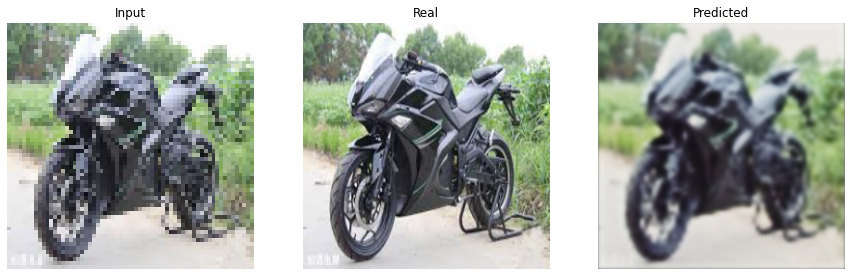

epoch: 1   loss: 0.1717418134212494
-------- psnr:  23.509321    ----- epoch:  1   count:  170


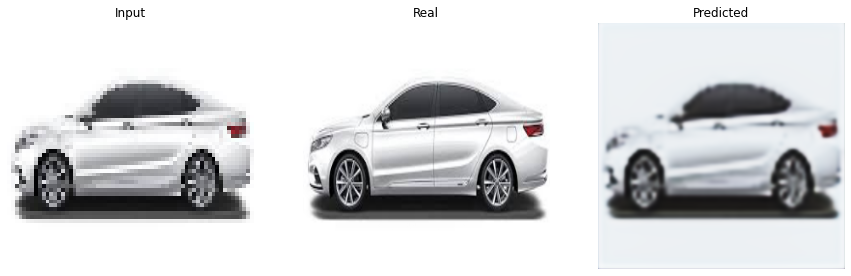

epoch: 2   loss: 0.1620805412530899
-------- psnr:  23.828094    ----- epoch:  2   count:  170


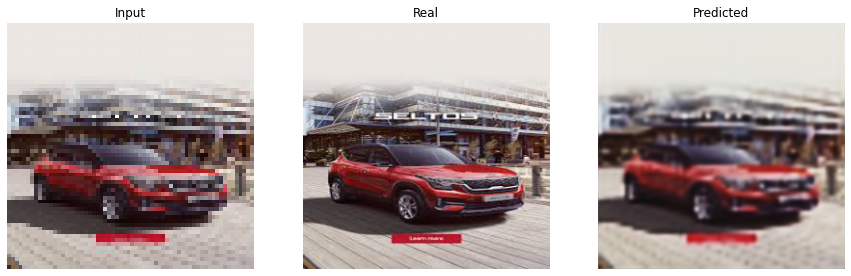

epoch: 3   loss: 0.15689824521541595
-------- psnr:  23.281723    ----- epoch:  3   count:  170
epoch: 4   loss: 0.1582929939031601
-------- psnr:  23.422369    ----- epoch:  4   count:  170
epoch: 5   loss: 0.15585406124591827
-------- psnr:  24.019325    ----- epoch:  5   count:  170


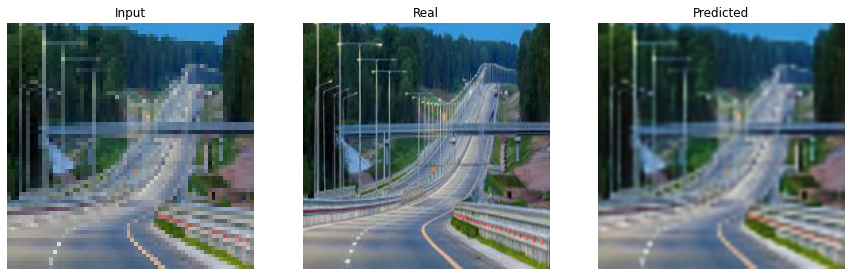

epoch: 6   loss: 0.14978556334972382
-------- psnr:  24.016157    ----- epoch:  6   count:  170
epoch: 7   loss: 0.14798834919929504
-------- psnr:  24.105457    ----- epoch:  7   count:  170


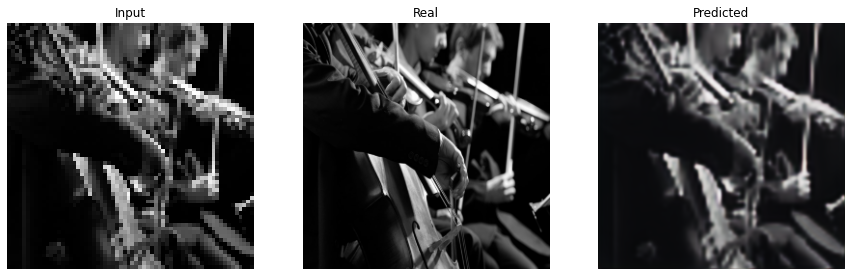

epoch: 8   loss: 0.14599904417991638
-------- psnr:  23.937878    ----- epoch:  8   count:  170
epoch: 9   loss: 0.1446104198694229
-------- psnr:  24.222235    ----- epoch:  9   count:  170


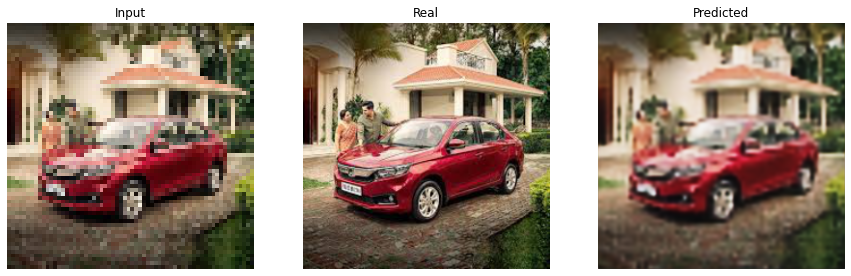

epoch: 10   loss: 0.1438502073287964
-------- psnr:  24.320284    ----- epoch:  10   count:  170


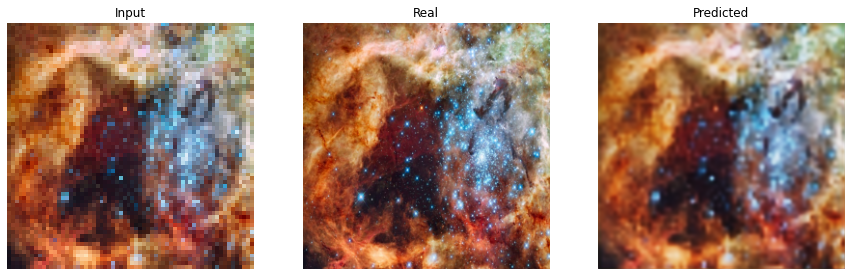

epoch: 11   loss: 0.14109808206558228
-------- psnr:  24.340853    ----- epoch:  11   count:  170


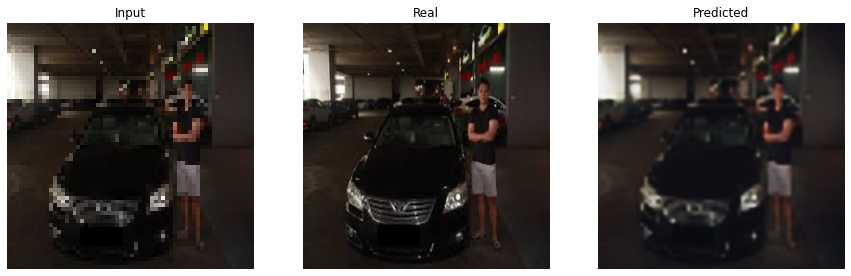

epoch: 12   loss: 0.1411275714635849
-------- psnr:  24.25808    ----- epoch:  12   count:  170
epoch: 13   loss: 0.14003343880176544
-------- psnr:  24.338085    ----- epoch:  13   count:  170
epoch: 14   loss: 0.13727785646915436
-------- psnr:  24.102232    ----- epoch:  14   count:  170
epoch: 15   loss: 0.13732761144638062
-------- psnr:  24.41084    ----- epoch:  15   count:  170


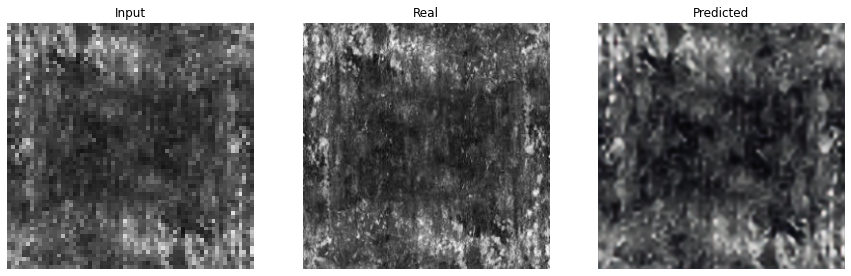

epoch: 16   loss: 0.13573309779167175
-------- psnr:  24.223673    ----- epoch:  16   count:  170
epoch: 17   loss: 0.1338064819574356
-------- psnr:  23.97297    ----- epoch:  17   count:  170
epoch: 18   loss: 0.1351238489151001
-------- psnr:  24.41248    ----- epoch:  18   count:  170


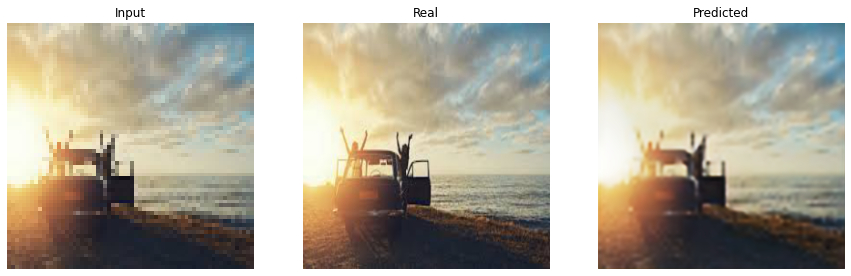

epoch: 19   loss: 0.1324126124382019
-------- psnr:  24.185463    ----- epoch:  19   count:  170
epoch: 20   loss: 0.13074882328510284
-------- psnr:  24.448332    ----- epoch:  20   count:  170


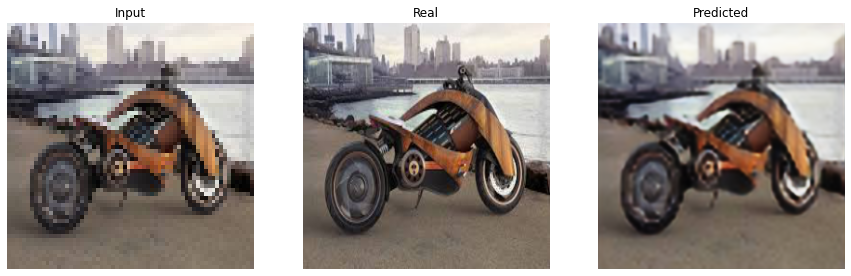

epoch: 21   loss: 0.13043297827243805
-------- psnr:  24.418762    ----- epoch:  21   count:  170
epoch: 22   loss: 0.12923073768615723
-------- psnr:  24.609024    ----- epoch:  22   count:  170


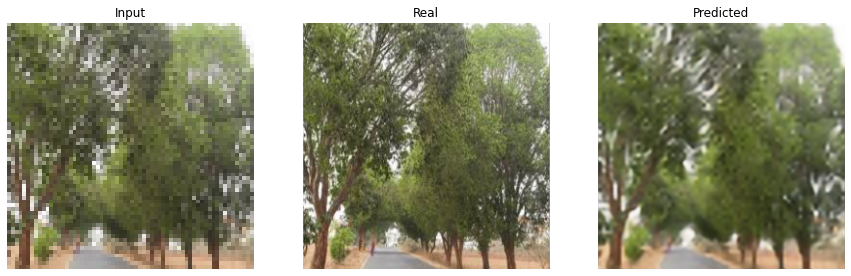

epoch: 23   loss: 0.12795314192771912
-------- psnr:  24.352299    ----- epoch:  23   count:  170
epoch: 24   loss: 0.12692201137542725
-------- psnr:  24.533823    ----- epoch:  24   count:  170
epoch: 25   loss: 0.1253858059644699
-------- psnr:  24.368055    ----- epoch:  25   count:  170
epoch: 26   loss: 0.1251739114522934
-------- psnr:  24.713062    ----- epoch:  26   count:  170


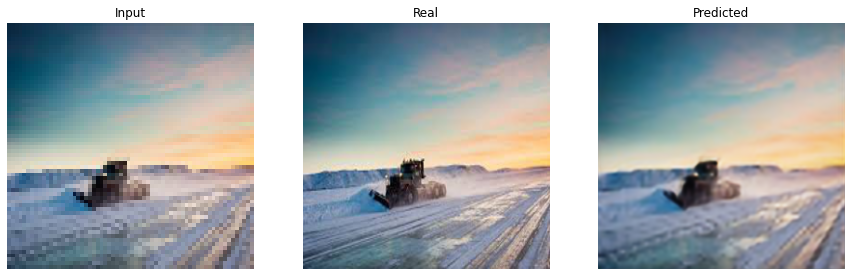

epoch: 27   loss: 0.12518419325351715
-------- psnr:  24.706308    ----- epoch:  27   count:  170
epoch: 28   loss: 0.12311308830976486
-------- psnr:  24.51449    ----- epoch:  28   count:  170
epoch: 29   loss: 0.12129268050193787
-------- psnr:  24.667507    ----- epoch:  29   count:  170
epoch: 30   loss: 0.1227443516254425
-------- psnr:  24.136889    ----- epoch:  30   count:  170
epoch: 31   loss: 0.12379681318998337
-------- psnr:  24.611897    ----- epoch:  31   count:  170
epoch: 32   loss: 0.12074592709541321
-------- psnr:  24.60191    ----- epoch:  32   count:  170
epoch: 33   loss: 0.11966763436794281
-------- psnr:  24.663942    ----- epoch:  33   count:  170
epoch: 34   loss: 0.1188899502158165
-------- psnr:  24.727386    ----- epoch:  34   count:  170


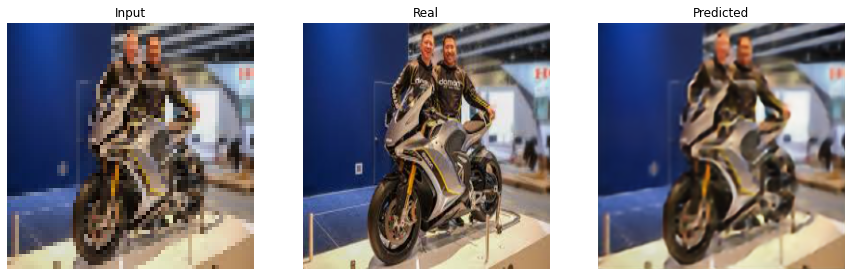

epoch: 35   loss: 0.11836525797843933
-------- psnr:  24.613447    ----- epoch:  35   count:  170
epoch: 36   loss: 0.11766587197780609
-------- psnr:  24.799849    ----- epoch:  36   count:  170


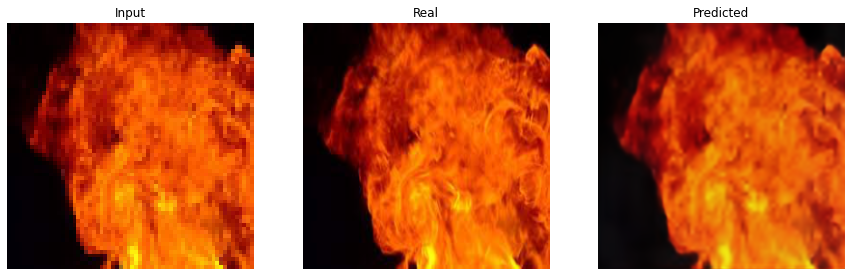

epoch: 37   loss: 0.11712255328893661
-------- psnr:  24.773714    ----- epoch:  37   count:  170
epoch: 38   loss: 0.11629049479961395
-------- psnr:  24.457958    ----- epoch:  38   count:  170
epoch: 39   loss: 0.11585420370101929
-------- psnr:  24.760975    ----- epoch:  39   count:  170


In [ ]:
EPOCHS = 40
fit(train_dataset, EPOCHS, test_dataset)

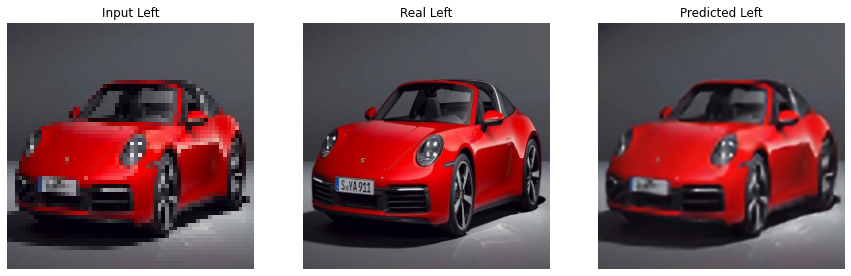

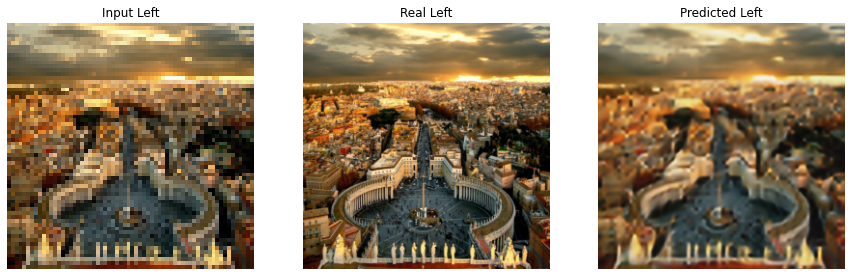

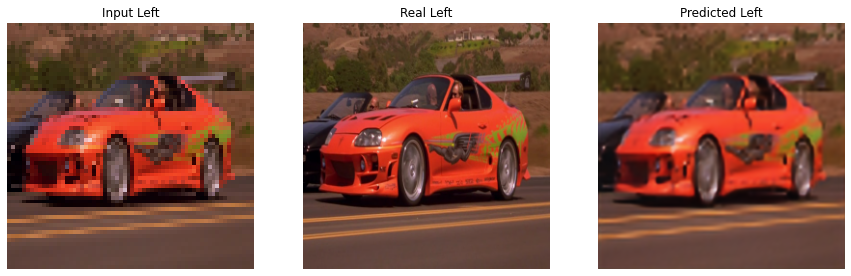

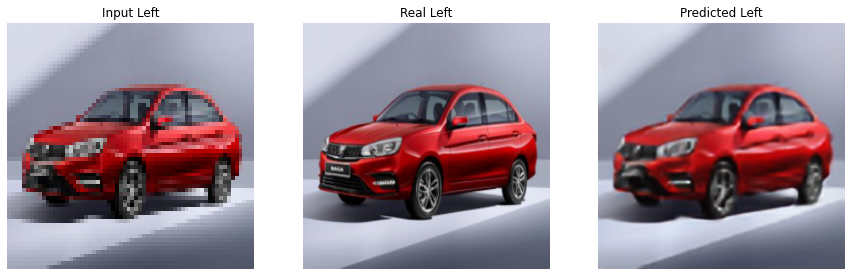

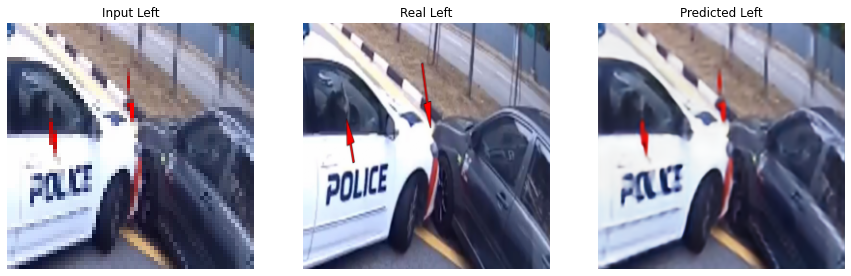

In [ ]:
for _ in range(5):
    for inputs, targets in test_dataset.take(1):
        fake = SR_unet_model([inputs], training=True)
        plt.figure(figsize=(15,20))

        display_list = [inputs[0], targets[0], fake[0]]
        title = ['Input Left', 'Real Left', 'Predicted Left']    

        for i in range(3):
            plt.subplot(1, 3, i+1)
            plt.title(title[i])
            plt.imshow(display_list[i] * 0.5 + 0.5)
            plt.axis('off')
        plt.show() 